# crée un fitness landscape

## organiser les donner depuis un fichier avec smile et energie

In [1]:
from rdkit import Chem
from rdkit.Chem import rdMolDescriptors, Descriptors, inchi
import itertools
import json
import numpy as np
import pandas as pd
import os

###############################################################################
# PARAMÈTRES DE SORTIE
###############################################################################
output_json = "analyse_matrices.json"
energies_file = "molecule_energies.txt"

###############################################################################
# MAPPING DES SUBSTITUANTS
###############################################################################
SUBSTITUENT_MAPPING = {
    "[H]": "H",
    "cN": "NH2",
    "c[N+](=O)[O-]": "NO2",
    "cC=O": "CHO",
    "cC#N": "CN",
    "cO": "OH",
    "cF": "F",
    "cC": "CH3",
    "cC=C": "CHCH2",
}

def map_substituent(smiles):
    """Convertit un SMILES de substituant en label court"""
    if smiles in SUBSTITUENT_MAPPING:
        return SUBSTITUENT_MAPPING[smiles]
    try:
        canon_smiles = Chem.MolToSmiles(Chem.MolFromSmiles(smiles), canonical=True)
        if canon_smiles in SUBSTITUENT_MAPPING:
            return SUBSTITUENT_MAPPING[canon_smiles]
    except:
        pass
    return smiles

###############################################################################
# FONCTIONS D’ANALYSE
###############################################################################
def relative_distance(pos1, pos2):
    """Distance sur un cycle benzénique (0=même, 1=ortho, 2=meta, 3=para)"""
    d = abs(pos1 - pos2)
    dist = min(d, 6 - d)
    return dist

def get_substituent_smiles(mol, atom_idx, benzene_ring):
    """Retourne le SMILES d’un substituant lié à un atome du cycle"""
    atom = mol.GetAtomWithIdx(atom_idx)
    for neighbor in atom.GetNeighbors():
        neighbor_idx = neighbor.GetIdx()
        if neighbor_idx not in benzene_ring:
            substituent_atoms = set()
            stack = [neighbor_idx]
            while stack:
                current_idx = stack.pop()
                if current_idx in substituent_atoms:
                    continue
                substituent_atoms.add(current_idx)
                current_atom = mol.GetAtomWithIdx(current_idx)
                for nei in current_atom.GetNeighbors():
                    nei_idx = nei.GetIdx()
                    if (
                        nei_idx != atom_idx
                        and nei_idx not in substituent_atoms
                        and nei_idx not in benzene_ring
                    ):
                        stack.append(nei_idx)
            if substituent_atoms:
                substituent_atoms.add(atom_idx)
                emol = Chem.RWMol()
                atom_mapping = {}
                for old_idx in substituent_atoms:
                    old_atom = mol.GetAtomWithIdx(old_idx)
                    new_atom = Chem.Atom(old_atom.GetAtomicNum())
                    new_atom.SetFormalCharge(old_atom.GetFormalCharge())
                    new_atom.SetIsAromatic(old_atom.GetIsAromatic())
                    new_idx = emol.AddAtom(new_atom)
                    atom_mapping[old_idx] = new_idx
                for old_idx in substituent_atoms:
                    old_atom = mol.GetAtomWithIdx(old_idx)
                    for neighbor in old_atom.GetNeighbors():
                        neighbor_idx = neighbor.GetIdx()
                        if neighbor_idx in substituent_atoms and neighbor_idx > old_idx:
                            bond = mol.GetBondBetweenAtoms(old_idx, neighbor_idx)
                            if bond:
                                emol.AddBond(
                                    atom_mapping[old_idx],
                                    atom_mapping[neighbor_idx],
                                    bond.GetBondType(),
                                )
                substituent_mol = emol.GetMol()
                try:
                    smiles = Chem.MolToSmiles(
                        substituent_mol,
                        rootedAtAtom=atom_mapping[atom_idx],
                        canonical=True,
                    )
                    return smiles
                except:
                    try:
                        return Chem.MolToSmiles(substituent_mol, canonical=True)
                    except:
                        return f"Unk_{atom_idx + 1}"
    return "[H]"

def analyse_benzene(mol):
    """Analyse un cycle benzénique et génère la matrice de distances"""
    ring_info = mol.GetRingInfo()
    aromatic_rings = [
        ring
        for ring in ring_info.AtomRings()
        if all(mol.GetAtomWithIdx(a).GetIsAromatic() for a in ring)
        and len(ring) == 6
    ]
    if not aromatic_rings:
        return None

    benzene_ring = aromatic_rings[0]
    subs = {}
    subs_detailed = {}

    print(f"\n🔍 Analyse de: {Chem.MolToSmiles(mol)}")
    benzene_ring_sorted = sorted(benzene_ring)

    for idx in benzene_ring_sorted:
        atom = mol.GetAtomWithIdx(idx)
        has_substituent = any(
            n.GetIdx() not in benzene_ring for n in atom.GetNeighbors()
        )
        position = benzene_ring_sorted.index(idx) + 1

        if has_substituent:
            sub_smiles = get_substituent_smiles(mol, idx, benzene_ring)
            sub_label = map_substituent(sub_smiles)
        else:
            sub_smiles, sub_label = "[H]", "H"

        subs[position] = sub_label
        subs_detailed[position] = {"smiles": sub_smiles, "label": sub_label}
        print(f"   Position {position}: {sub_smiles} -> {sub_label}")

    if len(subs) != 6:
        print(f"   ⚠️ Attention: {len(subs)} positions au lieu de 6")
        return None

    positions = sorted(subs.keys())
    n = len(positions)
    matrix = np.zeros((n, n), dtype=int)

    for i, pos1 in enumerate(positions):
        for j, pos2 in enumerate(positions):
            matrix[i, j] = relative_distance(pos1, pos2)

    labels = [subs[p] for p in positions]
    df = pd.DataFrame(matrix, index=labels, columns=labels)

    print(f"   ✓ Matrice créée - Valeurs uniques: {np.unique(matrix)}")
    return subs_detailed, df

###############################################################################
# CHARGEMENT ET ANALYSE DES MOLÉCULES
###############################################################################
try:
    energies_df = pd.read_csv(energies_file, sep="\t")
    if len(energies_df.columns) == 1:
        energies_df = pd.read_csv(energies_file, sep="\s+", engine="python")
    energies_df.columns = energies_df.columns.str.strip()
    for col in ["HOMO (Ha)", "LUMO (Ha)", "GAP (eV)"]:
        if col in energies_df.columns:
            energies_df[col] = (
                energies_df[col].astype(str).str.replace(",", ".").astype(float)
            )
except Exception as e:
    print(f"⚠️ Erreur lecture énergies : {e}")
    energies_df = pd.DataFrame()

results = []

if not energies_df.empty and "SMILES" in energies_df.columns:
    for _, row in energies_df.iterrows():
        smi = row["SMILES"]
        mol = Chem.MolFromSmiles(smi)
        if mol is None:
            print(f"❌ Impossible de parser: {smi}")
            continue

        try:
            result = analyse_benzene(mol)
            if result is None:
                continue
            subs_detailed, df = result
        except Exception as e:
            print(f"Erreur sur {smi}: {e}")
            continue

        mol_data = {
            "SMILES": smi,
            "Fichier": row.get("File", ""),
            "Nb_substituants": len(subs_detailed),
            "Substituants_detailed": subs_detailed,
            "Substituants_simple": {p: d["label"] for p, d in subs_detailed.items()},
            "Matrice_positions": df.values.tolist(),
            "Labels": list(df.columns),
            "Energies": {
                "HOMO_Ha": row.get("HOMO (Ha)"),
                "LUMO_Ha": row.get("LUMO (Ha)"),
                "GAP_eV": row.get("GAP (eV)"),
            },
        }

        results.append(mol_data)
        print(f"✅ Molécule analysée: {smi}")

with open(output_json, "w") as f:
    json.dump(results, f, indent=2)

###############################################################################
# RÉSUMÉ FINAL
###############################################################################
print(f"\n📊 {len(results)} molécules analysées")
print(f"💾 Fichier JSON généré : {output_json}")

if len(results) > 0:
    ex = results[0]
    print("\n🔍 Exemple de molécule :")
    print(f"SMILES: {ex['SMILES']}")
    print(f"Substituants: {ex['Substituants_simple']}")
    df = pd.DataFrame(ex["Matrice_positions"], index=ex["Labels"], columns=ex["Labels"])
    print(df)



🔍 Analyse de: C=Cc1c(N)cc(F)c(O)c1N
   Position 1: [H] -> H
   Position 2: cN -> NH2
   Position 3: cC=C -> CHCH2
   Position 4: cN -> NH2
   Position 5: cO -> OH
   Position 6: cF -> F
   ✓ Matrice créée - Valeurs uniques: [0 1 2 3]
✅ Molécule analysée: c1c(N)c(C=C)c(N)c(O)c1(F)

🔍 Analyse de: C=Cc1c(C#N)cc(N)c([N+](=O)[O-])c1[N+](=O)[O-]
   Position 1: [H] -> H
   Position 2: cN -> NH2
   Position 3: c[N+](=O)[O-] -> NO2
   Position 4: c[N+](=O)[O-] -> NO2
   Position 5: cC=C -> CHCH2
   Position 6: cC#N -> CN
   ✓ Matrice créée - Valeurs uniques: [0 1 2 3]
✅ Molécule analysée: c1c(N)c(N(=O)(=O))c(N(=O)(=O))c(C=C)c1(C#N)

🔍 Analyse de: N#Cc1cc(N)c([N+](=O)[O-])cc1F
   Position 1: [H] -> H
   Position 2: cN -> NH2
   Position 3: c[N+](=O)[O-] -> NO2
   Position 4: [H] -> H
   Position 5: cF -> F
   Position 6: cC#N -> CN
   ✓ Matrice créée - Valeurs uniques: [0 1 2 3]
✅ Molécule analysée: c1c(N)c(N(=O)(=O))cc(F)c1(C#N)

🔍 Analyse de: C=Cc1c(O)cc(N)c(C)c1C=O
   Position 1: [H] -> H
  

## generer une marche aleatoir

### marche aleatoir de molecule en molecule sans regle

In [2]:
import random
from datetime import datetime
import pandas as pd

# Liste des substituants possibles
SUBSTITUANTS = ["H","NH2","NO2","CHO","CN","OH","F","CH3","CHCH2"]

# Fonction pour générer une molécule aléatoire (6 positions)
def generer_molecule_aleatoire():
    return [random.choice(SUBSTITUANTS) for _ in range(6)]

# Matrice des distances (cycle benzénique)
def generer_matrice_positions():
    return [
        [0, 1, 2, 3, 2, 1],
        [1, 0, 1, 2, 3, 2],
        [2, 1, 0, 1, 2, 3],
        [3, 2, 1, 0, 1, 2],
        [2, 3, 2, 1, 0, 1],
        [1, 2, 3, 2, 1, 0]
    ]

def calculer_matrice_distances(substituants):
    n = len(substituants)
    distances_cycle = generer_matrice_positions()
    groupes = {}
    for i, sub in enumerate(substituants):
        groupes.setdefault(sub, []).append(i)

    labels, lignes = [], []
    for sub in sorted(groupes.keys()):
        for idx in groupes[sub]:
            labels.append(sub)
            ligne = []
            for sub2 in sorted(groupes.keys()):
                for idx2 in groupes[sub2]:
                    ligne.append(distances_cycle[idx][idx2])
            lignes.append(ligne)
    return labels, lignes

def afficher_matrice_distances_formatee(substituants):
    labels, matrice = calculer_matrice_distances(substituants)
    max_label_width = max(len(label) for label in labels)
    resultat = []
    header = " " * (max_label_width + 2) + "".join(f"{label:>6}" for label in labels)
    resultat.append(header)
    for i, label in enumerate(labels):
        ligne = f"{label:>{max_label_width}}  " + "".join(f"{val:>6}" for val in matrice[i])
        resultat.append(ligne)
    return "\n".join(resultat)

# ==============================================================
# Lecture des énergies depuis molecule_energies.txt
# ==============================================================

def lire_energies(fichier="molecule_energies.txt"):
    df = pd.read_csv(fichier, sep="\t")
    donnees = []
    for _, row in df.iterrows():
        donnees.append({
            "Fichier": row["File"],
            "SMILES": row["SMILES"],
            "HOMO_Ha": float(row["HOMO (Ha)"]),
            "LUMO_Ha": float(row["LUMO (Ha)"]),
            "GAP_eV": float(row["GAP (eV)"])
        })
    return donnees

# Fonction principale
def marche_aleatoire_complete(nb_etapes=50):
    donnees = lire_energies()
    with open("marche_aleatoire.txt", "w", encoding="utf-8") as f:
        f.write("="*80 + "\n")
        f.write("MARCHE ALÉATOIRE COMPLETE À PARTIR DU BENZÈNE\n")
        f.write(f"Date: {datetime.now()}\n")
        f.write(f"Nombre d'étapes: {nb_etapes}\n")
        f.write("="*80 + "\n\n")

        # Étape 0 : benzène pur
        substituants_actuels = ["H"]*6
        f.write("ÉTAPE 0 - COMPOSÉ DE DÉPART\n")
        f.write("-"*80 + "\n")
        f.write(f"Substituants: {substituants_actuels}\n")
        f.write("Positions: " + ", ".join([f"{i+1}=H" for i in range(6)]) + "\n")
        
        # Si on a une correspondance dans la base, prendre la première ligne
        benzene_data = next((d for d in donnees if d["SMILES"]=="c1ccccc1"), None)
        if benzene_data:
            f.write("\nÉnergies:\n")
            f.write(f"  HOMO: {benzene_data['HOMO_Ha']:.5f} Ha\n")
            f.write(f"  LUMO: {benzene_data['LUMO_Ha']:.5f} Ha\n")
            f.write(f"  GAP:  {benzene_data['GAP_eV']:.5f} eV\n")
        else:
            f.write("\nÉnergies:\n")
            f.write(f"  HOMO: {random.uniform(-10, -5):.5f} Ha\n")
            f.write(f"  LUMO: {random.uniform(-2, 5):.5f} Ha\n")
            f.write(f"  GAP:  {random.uniform(5, 15):.5f} eV\n")
        
        f.write("\nMatrice des distances entre substituants:\n")
        f.write(afficher_matrice_distances_formatee(substituants_actuels))
        f.write("\n\n")

        # Étapes suivantes : molécules complètement aléatoires
        for etape in range(1, nb_etapes+1):
            substituants_actuels = generer_molecule_aleatoire()
            # On choisit un composé aléatoire dans la base pour récupérer ses énergies
            compose = random.choice(donnees)
            f.write(f"ÉTAPE {etape}\n")
            f.write("-"*80 + "\n")
            f.write(f"Substituants: {substituants_actuels}\n")
            f.write("Positions: " + ", ".join([f"{i+1}={s}" for i, s in enumerate(substituants_actuels)]) + "\n")
            f.write("\nÉnergies:\n")
            f.write(f"  HOMO: {compose['HOMO_Ha']:.5f} Ha\n")
            f.write(f"  LUMO: {compose['LUMO_Ha']:.5f} Ha\n")
            f.write(f"  GAP:  {compose['GAP_eV']:.5f} eV\n")
            f.write("\nMatrice des distances entre substituants:\n")
            f.write(afficher_matrice_distances_formatee(substituants_actuels))
            f.write("\n\n")

        f.write("="*80 + "\n")
        f.write("FIN DE LA MARCHE ALÉATOIRE COMPLETE\n")
        f.write("="*80 + "\n")

    print("Marche aléatoire complète terminée ! Résultats dans 'marche_aleatoire.txt'")

# Exécution
if __name__ == "__main__":
    marche_aleatoire_complete(nb_etapes=300)


Marche aléatoire complète terminée ! Résultats dans 'marche_aleatoire.txt'


### de proche en proche remplacent les substituant 1 par 1 sans regle

In [10]:
import json
import random
from datetime import datetime

# Liste des substituants disponibles
SUBSTITUANTS = [
    "H",
    "NH2",
    "NO2",
    "CHO",
    "CN",
    "OH",
    "F",
    "CH3",
    "CHCH2"
]

def charger_donnees(fichier):
    """Charge les données depuis le fichier JSON"""
    with open(fichier, 'r') as f:
        return json.load(f)

def generer_rotations(substituants):
    """Génère toutes les rotations possibles d'une configuration"""
    rotations = []
    n = len(substituants)
    for i in range(n):
        rotations.append(substituants[i:] + substituants[:i])
    return rotations

def generer_miroir(substituants):
    """Génère le miroir d'une configuration (inversion de l'ordre sauf position 1)"""
    # Miroir : on garde la position 1 et on inverse l'ordre des autres
    return [substituants[0]] + substituants[1:][::-1]

def generer_toutes_symetries(substituants):
    """Génère toutes les configurations équivalentes (rotations + miroirs)"""
    symetries = []
    
    # Toutes les rotations
    for rotation in generer_rotations(substituants):
        symetries.append(rotation)
    
    # Miroir puis toutes ses rotations
    miroir = generer_miroir(substituants)
    for rotation in generer_rotations(miroir):
        symetries.append(rotation)
    
    return symetries

def creer_signature_canonique(substituants):
    """Crée une signature canonique unique pour toutes les formes symétriques"""
    symetries = generer_toutes_symetries(substituants)
    # Convertir en tuples pour pouvoir trier
    symetries_tuples = [tuple(s) for s in symetries]
    # La signature canonique est la forme lexicographiquement minimale
    return min(symetries_tuples)

def construire_index_signatures(donnees):
    """Construit un dictionnaire : signature canonique -> composé"""
    index = {}
    for compose in donnees:
        # Reconstruire la liste des substituants depuis Substituants_simple
        substituants = [compose['Substituants_simple'][str(i+1)] for i in range(6)]
        signature = creer_signature_canonique(substituants)
        index[signature] = compose
    return index

def trouver_compose_par_signature(index, substituants):
    """Cherche un composé par sa signature canonique"""
    signature = creer_signature_canonique(substituants)
    return index.get(signature, None)

def generer_matrice_positions():
    """Génère la matrice de positions standard pour un benzène"""
    return [
        [0, 1, 2, 3, 2, 1],
        [1, 0, 1, 2, 3, 2],
        [2, 1, 0, 1, 2, 3],
        [3, 2, 1, 0, 1, 2],
        [2, 3, 2, 1, 0, 1],
        [1, 2, 3, 2, 1, 0]
    ]
def calculer_matrice_distances(substituants):
    """Calcule la matrice de distances entre substituants avec leurs labels"""
    n = len(substituants)
    # Matrice de distances sur le cycle benzénique
    distances_cycle = generer_matrice_positions()
    
    # Créer un dictionnaire pour grouper par substituant
    groupes = {}
    for i, sub in enumerate(substituants):
        if sub not in groupes:
            groupes[sub] = []
        groupes[sub].append(i)
    
    # Construire la matrice avec labels
    lignes = []
    labels = []
    
    for sub in sorted(groupes.keys()):
        for idx in groupes[sub]:
            labels.append(sub)
            ligne = []
            for sub2 in sorted(groupes.keys()):
                for idx2 in groupes[sub2]:
                    ligne.append(distances_cycle[idx][idx2])
            lignes.append(ligne)
    
    return labels, lignes

def afficher_matrice_distances_formatee(substituants):
    """Affiche la matrice de distances de manière formatée"""
    labels, matrice = calculer_matrice_distances(substituants)
    
    # Trouver la largeur max pour l'alignement
    max_label_width = max(len(label) for label in labels)
    
    # En-tête
    resultat = []
    header = " " * (max_label_width + 2)
    for label in labels:
        header += f"{label:>6}"
    resultat.append(header)
    
    # Lignes de la matrice
    for i, label in enumerate(labels):
        ligne = f"{label:>{max_label_width}}  "
        for val in matrice[i]:
            ligne += f"{val:>6}"
        resultat.append(ligne)
    
    return "\n".join(resultat)

def changer_substituant(substituants_actuels, position_fixe):
    """Change un substituant à une position fixée"""
    nouvelle_config = substituants_actuels.copy()
    ancien_sub = nouvelle_config[position_fixe]
    
    # Choisir un nouveau substituant différent de l'actuel
    nouveaux_possibles = [s for s in SUBSTITUANTS if s != ancien_sub]
    nouveau_sub = random.choice(nouveaux_possibles)
    
    nouvelle_config[position_fixe] = nouveau_sub
    
    return nouvelle_config, ancien_sub, nouveau_sub

def marche_aleatoire(fichier_json, nb_etapes=5, max_essais=100):
    """Effectue une marche aléatoire dans l'espace des composés"""
    
    # Charger les données et construire l'index
    donnees = charger_donnees(fichier_json)
    index_signatures = construire_index_signatures(donnees)
    
    print(f"Index créé avec {len(index_signatures)} signatures uniques")
    
    # Composé de départ : benzène (tous H)
    substituants_actuels = ["H", "H", "H", "H", "H", "H"]
    
    # Ouvrir le fichier de sortie
    with open('marche_aleatoire.txt', 'w', encoding='utf-8') as f:
        f.write("=" * 80 + "\n")
        f.write("MARCHE ALÉATOIRE - COMPOSÉS BENZÉNIQUES (avec gestion des symétries)\n")
        f.write(f"Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Nombre d'étapes: {nb_etapes}\n")
        f.write("=" * 80 + "\n\n")
        
        # Étape 0 : Composé de départ
        f.write("ÉTAPE 0 - COMPOSÉ DE DÉPART\n")
        f.write("-" * 80 + "\n")
        compose_depart = trouver_compose_par_signature(index_signatures, substituants_actuels)
        
        if compose_depart:
            f.write(f"SMILES: {compose_depart['SMILES']}\n")
            f.write(f"Fichier: {compose_depart['Fichier']}\n")
            f.write(f"Substituants (forme trouvée): {[compose_depart['Substituants_simple'][str(i+1)] for i in range(6)]}\n")
        else:
            f.write("Composé: Benzène (non calculé dans les données)\n")
        
        f.write(f"Substituants (forme demandée): {substituants_actuels}\n")
        f.write("Positions: 1=H, 2=H, 3=H, 4=H, 5=H, 6=H\n")
        
        if compose_depart and 'Energies' in compose_depart:
            energies = compose_depart['Energies']
            f.write(f"\nÉnergies:\n")
            f.write(f"  HOMO: {energies['HOMO_Ha']:.5f} Ha\n")
            f.write(f"  LUMO: {energies['LUMO_Ha']:.5f} Ha\n")
            f.write(f"  GAP:  {energies['GAP_eV']:.6f} eV\n")
        
        f.write("\nMatrice des distances entre substituants:\n")
        f.write(afficher_matrice_distances_formatee(substituants_actuels))
        f.write("\n")
        
        f.write("\n\n")
        
        # Effectuer les étapes de la marche aléatoire
        for etape in range(1, nb_etapes + 1):
            f.write(f"ÉTAPE {etape}\n")
            f.write("-" * 80 + "\n")
            
            # Essayer de trouver un composé existant
            trouve = False
            positions_essayees = []
            essais_par_position = {}
            
            # Essayer différentes positions si nécessaire
            while not trouve and len(positions_essayees) < 6:
                # Choisir une position non encore essayée
                positions_disponibles = [i for i in range(6) if i not in positions_essayees]
                if not positions_disponibles:
                    break
                
                position_a_changer = random.choice(positions_disponibles)
                positions_essayees.append(position_a_changer)
                
                f.write(f"Position choisie pour changement: {position_a_changer + 1}\n")
                
                # 9 essais de substituants pour cette position
                essais = 0
                tentatives_substituants = []
                
                while not trouve and essais < 9:
                    essais += 1
                    nouvelle_config, ancien, nouveau = changer_substituant(substituants_actuels, position_a_changer)
                    tentatives_substituants.append(nouveau)
                    compose = trouver_compose_par_signature(index_signatures, nouvelle_config)
                    
                    if compose:
                        trouve = True
                        substituants_actuels = nouvelle_config
                        
                        f.write(f"  ✓ Succès après {essais} essai(s)\n")
                        f.write(f"  Changement: Position {position_a_changer+1} : {ancien} → {nouveau}\n")
                        if essais > 1:
                            f.write(f"  Substituants testés: {', '.join(tentatives_substituants)}\n")
                        f.write("\n")
                        
                        # Afficher la forme trouvée dans la base
                        forme_trouvee = [compose['Substituants_simple'][str(i+1)] for i in range(6)]
                        
                        f.write(f"SMILES: {compose['SMILES']}\n")
                        f.write(f"Fichier: {compose['Fichier']}\n")
                        f.write(f"Substituants (forme demandée): {substituants_actuels}\n")
                        if forme_trouvee != substituants_actuels:
                            f.write(f"Substituants (forme trouvée):  {forme_trouvee}\n")
                            f.write(f"  → Configurations équivalentes par symétrie du benzène\n")
                        
                        # Afficher les positions détaillées
                        positions_str = ", ".join([f"{i+1}={sub}" for i, sub in enumerate(substituants_actuels)])
                        f.write(f"Positions: {positions_str}\n")
                        
                        # Énergies
                        if 'Energies' in compose:
                            energies = compose['Energies']
                            f.write(f"\nÉnergies:\n")
                            f.write(f"  HOMO: {energies['HOMO_Ha']:.5f} Ha\n")
                            f.write(f"  LUMO: {energies['LUMO_Ha']:.5f} Ha\n")
                            f.write(f"  GAP:  {energies['GAP_eV']:.6f} eV\n")
                        
                        # Matrice des distances
                        f.write("\nMatrice des distances entre substituants:\n")
                        f.write(afficher_matrice_distances_formatee(substituants_actuels))
                        f.write("\n")

                        f.write("\n\n")
                
                if not trouve:
                    essais_par_position[position_a_changer + 1] = tentatives_substituants
                    f.write(f"  ✗ Aucun composé trouvé pour position {position_a_changer + 1}\n")
                    f.write(f"  Substituants testés: {', '.join(tentatives_substituants)}\n")
                    f.write(f"  → Changement de position...\n\n")
            
            if not trouve:
                f.write(f"ATTENTION: Aucun composé trouvé après avoir testé {len(positions_essayees)} position(s)!\n")
                f.write(f"Positions testées: {[p+1 for p in positions_essayees]}\n")
                for pos, subs in essais_par_position.items():
                    f.write(f"  Position {pos}: {', '.join(subs)}\n")
                f.write("La marche aléatoire s'arrête ici.\n\n")
                break
        
        f.write("=" * 80 + "\n")
        f.write("FIN DE LA MARCHE ALÉATOIRE\n")
        f.write("=" * 80 + "\n")
    
    print(f"Marche aléatoire terminée ! Résultats dans 'marche_aleatoire.txt'")

# Exécution
if __name__ == "__main__":
    marche_aleatoire("analyse_matrices.json", nb_etapes=300, max_essais=100)

Index créé avec 23660 signatures uniques
Marche aléatoire terminée ! Résultats dans 'marche_aleatoire.txt'


### de proch en proch avec regle sur les substituant 

In [2]:
import json
import random
from datetime import datetime

# Liste des substituants disponibles
SUBSTITUANTS = [
    "H",
    "NH2",
    "NO2",
    "CHO",
    "CN",
    "OH",
    "F",
    "CH3",
    "CHCH2"
]

# Règles de transition : dictionnaire {substituant_actuel: [substituants_autorisés]}
# Si un substituant n'est pas dans le dictionnaire, tous les autres sont autorisés
# NH2 < OH < CH3 < CH=CH2 < H < F < CHO < CN < NO2
REGLES_TRANSITION = {
    "NH2": ["OH"],
    "OH": ["CH3", "NH2"],
    "CH3": ["CHCH2" , "OH"],
    "CHCH2": ["H" , "CH3"],
    "H": ["F" , "CHCH2"],
    "F": ["CHO" , "H"],
    "CHO": ["CN" , "F"],
    "CN": ["NO2", "CHO"],
    "NO2": ["CN"] 
}

def obtenir_substituants_autorises(substituant_actuel):
    """Retourne la liste des substituants autorisés depuis un substituant donné"""
    if substituant_actuel in REGLES_TRANSITION:
        # Utiliser les règles définies
        return REGLES_TRANSITION[substituant_actuel]
    else:
        # Si pas de règle, tous les autres substituants sont autorisés
        return [s for s in SUBSTITUANTS if s != substituant_actuel]

def charger_donnees(fichier):
    """Charge les données depuis le fichier JSON"""
    with open(fichier, 'r') as f:
        return json.load(f)

def generer_rotations(substituants):
    """Génère toutes les rotations possibles d'une configuration"""
    rotations = []
    n = len(substituants)
    for i in range(n):
        rotations.append(substituants[i:] + substituants[:i])
    return rotations

def generer_miroir(substituants):
    """Génère le miroir d'une configuration (inversion de l'ordre sauf position 1)"""
    return [substituants[0]] + substituants[1:][::-1]

def generer_toutes_symetries(substituants):
    """Génère toutes les configurations équivalentes (rotations + miroirs)"""
    symetries = []
    
    # Toutes les rotations
    for rotation in generer_rotations(substituants):
        symetries.append(rotation)
    
    # Miroir puis toutes ses rotations
    miroir = generer_miroir(substituants)
    for rotation in generer_rotations(miroir):
        symetries.append(rotation)
    
    return symetries

def creer_signature_canonique(substituants):
    """Crée une signature canonique unique pour toutes les formes symétriques"""
    symetries = generer_toutes_symetries(substituants)
    symetries_tuples = [tuple(s) for s in symetries]
    return min(symetries_tuples)

def construire_index_signatures(donnees):
    """Construit un dictionnaire : signature canonique -> composé"""
    index = {}
    for compose in donnees:
        substituants = [compose['Substituants_simple'][str(i+1)] for i in range(6)]
        signature = creer_signature_canonique(substituants)
        index[signature] = compose
    return index

def trouver_compose_par_signature(index, substituants):
    """Cherche un composé par sa signature canonique"""
    signature = creer_signature_canonique(substituants)
    return index.get(signature, None)

def generer_matrice_positions():
    """Génère la matrice de positions standard pour un benzène"""
    return [
        [0, 1, 2, 3, 2, 1],
        [1, 0, 1, 2, 3, 2],
        [2, 1, 0, 1, 2, 3],
        [3, 2, 1, 0, 1, 2],
        [2, 3, 2, 1, 0, 1],
        [1, 2, 3, 2, 1, 0]
    ]

def calculer_matrice_distances(substituants):
    """Calcule la matrice de distances entre substituants avec leurs labels"""
    n = len(substituants)
    distances_cycle = generer_matrice_positions()
    
    groupes = {}
    for i, sub in enumerate(substituants):
        if sub not in groupes:
            groupes[sub] = []
        groupes[sub].append(i)
    
    lignes = []
    labels = []
    
    for sub in sorted(groupes.keys()):
        for idx in groupes[sub]:
            labels.append(sub)
            ligne = []
            for sub2 in sorted(groupes.keys()):
                for idx2 in groupes[sub2]:
                    ligne.append(distances_cycle[idx][idx2])
            lignes.append(ligne)
    
    return labels, lignes

def afficher_matrice_distances_formatee(substituants):
    """Affiche la matrice de distances de manière formatée"""
    labels, matrice = calculer_matrice_distances(substituants)
    max_label_width = max(len(label) for label in labels)
    
    resultat = []
    header = " " * (max_label_width + 2)
    for label in labels:
        header += f"{label:>6}"
    resultat.append(header)
    
    for i, label in enumerate(labels):
        ligne = f"{label:>{max_label_width}}  "
        for val in matrice[i]:
            ligne += f"{val:>6}"
        resultat.append(ligne)
    
    return "\n".join(resultat)

def changer_substituant(substituants_actuels, position_fixe):
    """Change un substituant à une position fixée en respectant les règles"""
    nouvelle_config = substituants_actuels.copy()
    ancien_sub = nouvelle_config[position_fixe]
    
    # Obtenir les substituants autorisés selon les règles
    substituants_autorises = obtenir_substituants_autorises(ancien_sub)
    
    if not substituants_autorises:
        # Aucune transition autorisée
        return None, ancien_sub, None
    
    # Choisir un nouveau substituant parmi ceux autorisés
    nouveau_sub = random.choice(substituants_autorises)
    nouvelle_config[position_fixe] = nouveau_sub
    
    return nouvelle_config, ancien_sub, nouveau_sub

def afficher_regles_transition():
    """Retourne une chaîne formatée des règles de transition"""
    resultat = []
    resultat.append("Règles de transition définies:")
    for ancien, nouveaux in sorted(REGLES_TRANSITION.items()):
        resultat.append(f"  {ancien:>6} → {', '.join(nouveaux)}")
    resultat.append("\nAutres substituants: toutes transitions autorisées (sauf vers eux-mêmes)")
    return "\n".join(resultat)

def marche_aleatoire(fichier_json, nb_etapes=5, max_essais=100):
    """Effectue une marche aléatoire dans l'espace des composés"""
    
    # Charger les données et construire l'index
    donnees = charger_donnees(fichier_json)
    index_signatures = construire_index_signatures(donnees)
    
    print(f"Index créé avec {len(index_signatures)} signatures uniques")
    
    # Composé de départ : benzène (tous H)
    substituants_actuels = ["H", "H", "H", "H", "H", "H"]
    
    # Ouvrir le fichier de sortie
    with open('marche_aleatoire.txt', 'w', encoding='utf-8') as f:
        f.write("=" * 80 + "\n")
        f.write("MARCHE ALÉATOIRE - COMPOSÉS BENZÉNIQUES (avec règles de transition)\n")
        f.write(f"Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Nombre d'étapes: {nb_etapes}\n")
        f.write("=" * 80 + "\n\n")
        
        # Afficher les règles
        f.write(afficher_regles_transition())
        f.write("\n\n")
        f.write("=" * 80 + "\n\n")
        
        # Étape 0 : Composé de départ
        f.write("ÉTAPE 0 - COMPOSÉ DE DÉPART\n")
        f.write("-" * 80 + "\n")
        compose_depart = trouver_compose_par_signature(index_signatures, substituants_actuels)
        
        if compose_depart:
            f.write(f"SMILES: {compose_depart['SMILES']}\n")
            f.write(f"Fichier: {compose_depart['Fichier']}\n")
            f.write(f"Substituants (forme trouvée): {[compose_depart['Substituants_simple'][str(i+1)] for i in range(6)]}\n")
        else:
            f.write("Composé: Benzène (non calculé dans les données)\n")
        
        f.write(f"Substituants (forme demandée): {substituants_actuels}\n")
        f.write("Positions: 1=H, 2=H, 3=H, 4=H, 5=H, 6=H\n")
        
        if compose_depart and 'Energies' in compose_depart:
            energies = compose_depart['Energies']
            f.write(f"\nÉnergies:\n")
            f.write(f"  HOMO: {energies['HOMO_Ha']:.5f} Ha\n")
            f.write(f"  LUMO: {energies['LUMO_Ha']:.5f} Ha\n")
            f.write(f"  GAP:  {energies['GAP_eV']:.6f} eV\n")
        
        f.write("\nMatrice des distances entre substituants:\n")
        f.write(afficher_matrice_distances_formatee(substituants_actuels))
        f.write("\n\n\n")
        
        # Effectuer les étapes de la marche aléatoire
        for etape in range(1, nb_etapes + 1):
            f.write(f"ÉTAPE {etape}\n")
            f.write("-" * 80 + "\n")
            
            trouve = False
            positions_essayees = []
            essais_par_position = {}
            transitions_interdites = []
            
            # Essayer différentes positions si nécessaire
            while not trouve and len(positions_essayees) < 6:
                positions_disponibles = [i for i in range(6) if i not in positions_essayees]
                if not positions_disponibles:
                    break
                
                position_a_changer = random.choice(positions_disponibles)
                positions_essayees.append(position_a_changer)
                
                ancien_sub = substituants_actuels[position_a_changer]
                substituants_autorises = obtenir_substituants_autorises(ancien_sub)
                
                f.write(f"Position choisie pour changement: {position_a_changer + 1}\n")
                f.write(f"Substituant actuel: {ancien_sub}\n")
                f.write(f"Transitions autorisées: {', '.join(substituants_autorises)}\n")
                
                # Essais de substituants pour cette position
                essais = 0
                tentatives_substituants = []
                substituants_testes = set()
                
                while not trouve and len(substituants_testes) < len(substituants_autorises):
                    essais += 1
                    resultat = changer_substituant(substituants_actuels, position_a_changer)
                    
                    if resultat[0] is None:
                        # Aucune transition autorisée
                        f.write(f"  ✗ Aucune transition autorisée depuis {ancien_sub}\n")
                        break
                    
                    nouvelle_config, ancien, nouveau = resultat
                    substituants_testes.add(nouveau)
                    tentatives_substituants.append(nouveau)
                    compose = trouver_compose_par_signature(index_signatures, nouvelle_config)
                    
                    if compose:
                        trouve = True
                        substituants_actuels = nouvelle_config
                        
                        f.write(f"  ✓ Succès après {essais} essai(s)\n")
                        f.write(f"  Changement: Position {position_a_changer+1} : {ancien} → {nouveau}\n")
                        if essais > 1:
                            f.write(f"  Substituants testés: {', '.join(tentatives_substituants)}\n")
                        f.write("\n")
                        
                        forme_trouvee = [compose['Substituants_simple'][str(i+1)] for i in range(6)]
                        
                        f.write(f"SMILES: {compose['SMILES']}\n")
                        f.write(f"Fichier: {compose['Fichier']}\n")
                        f.write(f"Substituants (forme demandée): {substituants_actuels}\n")
                        if forme_trouvee != substituants_actuels:
                            f.write(f"Substituants (forme trouvée):  {forme_trouvee}\n")
                            f.write(f"  → Configurations équivalentes par symétrie du benzène\n")
                        
                        positions_str = ", ".join([f"{i+1}={sub}" for i, sub in enumerate(substituants_actuels)])
                        f.write(f"Positions: {positions_str}\n")
                        
                        if 'Energies' in compose:
                            energies = compose['Energies']
                            f.write(f"\nÉnergies:\n")
                            f.write(f"  HOMO: {energies['HOMO_Ha']:.5f} Ha\n")
                            f.write(f"  LUMO: {energies['LUMO_Ha']:.5f} Ha\n")
                            f.write(f"  GAP:  {energies['GAP_eV']:.6f} eV\n")
                        
                        f.write("\nMatrice des distances entre substituants:\n")
                        f.write(afficher_matrice_distances_formatee(substituants_actuels))
                        f.write("\n\n\n")
                
                if not trouve:
                    essais_par_position[position_a_changer + 1] = (ancien_sub, tentatives_substituants)
                    f.write(f"  ✗ Aucun composé trouvé pour position {position_a_changer + 1}\n")
                    f.write(f"  Substituants testés: {', '.join(tentatives_substituants)}\n")
                    f.write(f"  → Changement de position...\n\n")
            
            if not trouve:
                f.write(f"ATTENTION: Aucun composé trouvé après avoir testé {len(positions_essayees)} position(s)!\n")
                f.write(f"Positions testées: {[p+1 for p in positions_essayees]}\n")
                for pos, (ancien, subs) in essais_par_position.items():
                    f.write(f"  Position {pos} ({ancien}): {', '.join(subs)}\n")
                f.write("La marche aléatoire s'arrête ici.\n\n")
                break
        
        f.write("=" * 80 + "\n")
        f.write("FIN DE LA MARCHE ALÉATOIRE\n")
        f.write("=" * 80 + "\n")
    
    print(f"Marche aléatoire terminée ! Résultats dans 'marche_aleatoire.txt'")

# Exécution
if __name__ == "__main__":
    marche_aleatoire("analyse_matrices.json", nb_etapes=300, max_essais=100)

Index créé avec 23660 signatures uniques
Marche aléatoire terminée ! Résultats dans 'marche_aleatoire.txt'


### regle sur la position des substituant

In [17]:
import json
import random
from datetime import datetime

# Liste des substituants disponibles
SUBSTITUANTS = [
    "H",
    "NH2",
    "NO2",
    "CHO",
    "CN",
    "OH",
    "F",
    "CH3",
    "CHCH2"
]

# Règles de transition : dictionnaire {substituant_actuel: [substituants_autorisés]}
REGLES_TRANSITION = {
    "H": ["NH2"],
}

# Règles de position relative : dictionnaire {substituant: {contraintes}}
# "interdit_avec": liste de tuples (substituant, [distances interdites])
# "obligatoire_avec": liste de tuples (substituant, [distances obligatoires])
REGLES_POSITION = {
    "H": {
        "obligatoire_avec": [("H", [2])],   # NH2 doit être en meta (distance 2) de NH2 (si NH2 existe)
    },
}

def obtenir_substituants_autorises(substituant_actuel):
    """Retourne la liste des substituants autorisés depuis un substituant donné"""
    if substituant_actuel in REGLES_TRANSITION:
        return REGLES_TRANSITION[substituant_actuel]
    else:
        return [s for s in SUBSTITUANTS if s != substituant_actuel]

def calculer_distance_benzene(pos1, pos2):
    """Calcule la distance entre deux positions sur le cycle benzénique (0-5)"""
    diff = abs(pos1 - pos2)
    return min(diff, 6 - diff)

def verifier_contraintes_position(substituants, position_nouvelle, nouveau_sub):
    """Vérifie si l'ajout d'un substituant à une position respecte les règles de position"""
    
    # Si pas de règles pour ce substituant, tout est autorisé
    if nouveau_sub not in REGLES_POSITION:
        return True, "Aucune contrainte de position"
    
    regles = REGLES_POSITION[nouveau_sub]
    violations = []
    contraintes_respectees = []
    
    # Vérifier les interdictions
    if "interdit_avec" in regles:
        for sub_interdit, distances_interdites in regles["interdit_avec"]:
            for i, sub in enumerate(substituants):
                if sub == sub_interdit:
                    distance = calculer_distance_benzene(position_nouvelle, i)
                    if distance in distances_interdites:
                        violations.append(f"{nouveau_sub} interdit à distance {distance} de {sub_interdit} (position {i+1})")
    
    # Vérifier les obligations
    if "obligatoire_avec" in regles:
        for sub_requis, distances_requises in regles["obligatoire_avec"]:
            # Chercher si le substituant requis existe dans la molécule
            positions_sub_requis = [i for i, sub in enumerate(substituants) if sub == sub_requis]
            
            if positions_sub_requis:  # Si le substituant requis existe
                # Vérifier qu'au moins une position respecte la contrainte
                au_moins_une_ok = False
                for pos_requis in positions_sub_requis:
                    distance = calculer_distance_benzene(position_nouvelle, pos_requis)
                    if distance in distances_requises:
                        au_moins_une_ok = True
                        contraintes_respectees.append(f"{nouveau_sub} à distance {distance} de {sub_requis} (position {pos_requis+1}) ✓")
                        break
                
                if not au_moins_une_ok:
                    violations.append(f"{nouveau_sub} doit être à distance {distances_requises} d'au moins un {sub_requis}")
    
    # Si violations, retourner False
    if violations:
        return False, "; ".join(violations)
    
    # Sinon, retourner True avec les contraintes respectées
    message = "; ".join(contraintes_respectees) if contraintes_respectees else "Contraintes respectées"
    return True, message

def charger_donnees(fichier):
    """Charge les données depuis le fichier JSON"""
    with open(fichier, 'r') as f:
        return json.load(f)

def generer_rotations(substituants):
    """Génère toutes les rotations possibles d'une configuration"""
    rotations = []
    n = len(substituants)
    for i in range(n):
        rotations.append(substituants[i:] + substituants[:i])
    return rotations

def generer_miroir(substituants):
    """Génère le miroir d'une configuration"""
    return [substituants[0]] + substituants[1:][::-1]

def generer_toutes_symetries(substituants):
    """Génère toutes les configurations équivalentes (rotations + miroirs)"""
    symetries = []
    
    for rotation in generer_rotations(substituants):
        symetries.append(rotation)
    
    miroir = generer_miroir(substituants)
    for rotation in generer_rotations(miroir):
        symetries.append(rotation)
    
    return symetries

def creer_signature_canonique(substituants):
    """Crée une signature canonique unique pour toutes les formes symétriques"""
    symetries = generer_toutes_symetries(substituants)
    symetries_tuples = [tuple(s) for s in symetries]
    return min(symetries_tuples)

def construire_index_signatures(donnees):
    """Construit un dictionnaire : signature canonique -> composé"""
    index = {}
    for compose in donnees:
        substituants = [compose['Substituants_simple'][str(i+1)] for i in range(6)]
        signature = creer_signature_canonique(substituants)
        index[signature] = compose
    return index

def trouver_compose_par_signature(index, substituants):
    """Cherche un composé par sa signature canonique"""
    signature = creer_signature_canonique(substituants)
    return index.get(signature, None)

def generer_matrice_positions():
    """Génère la matrice de positions standard pour un benzène"""
    return [
        [0, 1, 2, 3, 2, 1],
        [1, 0, 1, 2, 3, 2],
        [2, 1, 0, 1, 2, 3],
        [3, 2, 1, 0, 1, 2],
        [2, 3, 2, 1, 0, 1],
        [1, 2, 3, 2, 1, 0]
    ]

def calculer_matrice_distances(substituants):
    """Calcule la matrice de distances entre substituants avec leurs labels"""
    n = len(substituants)
    distances_cycle = generer_matrice_positions()
    
    groupes = {}
    for i, sub in enumerate(substituants):
        if sub not in groupes:
            groupes[sub] = []
        groupes[sub].append(i)
    
    lignes = []
    labels = []
    
    for sub in sorted(groupes.keys()):
        for idx in groupes[sub]:
            labels.append(sub)
            ligne = []
            for sub2 in sorted(groupes.keys()):
                for idx2 in groupes[sub2]:
                    ligne.append(distances_cycle[idx][idx2])
            lignes.append(ligne)
    
    return labels, lignes

def afficher_matrice_distances_formatee(substituants):
    """Affiche la matrice de distances de manière formatée"""
    labels, matrice = calculer_matrice_distances(substituants)
    max_label_width = max(len(label) for label in labels)
    
    resultat = []
    header = " " * (max_label_width + 2)
    for label in labels:
        header += f"{label:>6}"
    resultat.append(header)
    
    for i, label in enumerate(labels):
        ligne = f"{label:>{max_label_width}}  "
        for val in matrice[i]:
            ligne += f"{val:>6}"
        resultat.append(ligne)
    
    return "\n".join(resultat)

def afficher_regles():
    """Retourne une chaîne formatée des règles"""
    resultat = []
    
    # Règles de transition
    resultat.append("RÈGLES DE TRANSITION:")
    resultat.append("-" * 60)
    for ancien, nouveaux in sorted(REGLES_TRANSITION.items()):
        resultat.append(f"  {ancien:>6} → {', '.join(nouveaux)}")
    resultat.append("  Autres: toutes transitions autorisées (sauf vers eux-mêmes)")
    resultat.append("")
    
    # Règles de position
    resultat.append("RÈGLES DE POSITION RELATIVE:")
    resultat.append("-" * 60)
    for sub, regles in sorted(REGLES_POSITION.items()):
        resultat.append(f"  {sub}:")
        if "interdit_avec" in regles:
            for autre_sub, distances in regles["interdit_avec"]:
                dist_str = ", ".join(map(str, distances))
                noms_dist = []
                if 1 in distances: noms_dist.append("ortho")
                if 2 in distances: noms_dist.append("meta")
                if 3 in distances: noms_dist.append("para")
                resultat.append(f"    ✗ Interdit à distance [{dist_str}] ({'/'.join(noms_dist)}) de {autre_sub}")
        
        if "obligatoire_avec" in regles:
            for autre_sub, distances in regles["obligatoire_avec"]:
                dist_str = ", ".join(map(str, distances))
                noms_dist = []
                if 1 in distances: noms_dist.append("ortho")
                if 2 in distances: noms_dist.append("meta")
                if 3 in distances: noms_dist.append("para")
                resultat.append(f"    ✓ Obligatoire à distance [{dist_str}] ({'/'.join(noms_dist)}) d'au moins un {autre_sub} (si présent)")
    
    return "\n".join(resultat)

def trouver_positions_valides(substituants_actuels, nouveau_sub):
    """Trouve toutes les positions valides pour ajouter un nouveau substituant"""
    positions_valides = []
    
    for pos in range(6):
        # Créer une copie temporaire avec le nouveau substituant
        temp_substituants = substituants_actuels.copy()
        temp_substituants[pos] = nouveau_sub
        
        # Vérifier les contraintes
        valide, raison = verifier_contraintes_position(substituants_actuels, pos, nouveau_sub)
        
        if valide:
            positions_valides.append((pos, raison))
    
    return positions_valides

def marche_aleatoire(fichier_json, nb_etapes=5, max_essais=100):
    """Effectue une marche aléatoire dans l'espace des composés"""
    
    # Charger les données et construire l'index
    donnees = charger_donnees(fichier_json)
    index_signatures = construire_index_signatures(donnees)
    
    print(f"Index créé avec {len(index_signatures)} signatures uniques")
    
    # Composé de départ : benzène (tous H)
    substituants_actuels = ["H", "H", "H", "H", "H", "H"]
    
    # Ouvrir le fichier de sortie
    with open('marche_aleatoire.txt', 'w', encoding='utf-8') as f:
        f.write("=" * 80 + "\n")
        f.write("MARCHE ALÉATOIRE - COMPOSÉS BENZÉNIQUES\n")
        f.write("(avec règles de transition et de position)\n")
        f.write(f"Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Nombre d'étapes: {nb_etapes}\n")
        f.write("=" * 80 + "\n\n")
        
        # Afficher les règles
        f.write(afficher_regles())
        f.write("\n\n")
        f.write("=" * 80 + "\n\n")
        
        # Étape 0 : Composé de départ
        f.write("ÉTAPE 0 - COMPOSÉ DE DÉPART\n")
        f.write("-" * 80 + "\n")
        compose_depart = trouver_compose_par_signature(index_signatures, substituants_actuels)
        
        if compose_depart:
            f.write(f"SMILES: {compose_depart['SMILES']}\n")
            f.write(f"Fichier: {compose_depart['Fichier']}\n")
        else:
            f.write("Composé: Benzène (non calculé dans les données)\n")
        
        f.write(f"Substituants: {substituants_actuels}\n")
        f.write("Positions: " + ", ".join([f"{i+1}={sub}" for i, sub in enumerate(substituants_actuels)]) + "\n")
        
        if compose_depart and 'Energies' in compose_depart:
            energies = compose_depart['Energies']
            f.write(f"\nÉnergies:\n")
            f.write(f"  HOMO: {energies['HOMO_Ha']:.5f} Ha\n")
            f.write(f"  LUMO: {energies['LUMO_Ha']:.5f} Ha\n")
            f.write(f"  GAP:  {energies['GAP_eV']:.6f} eV\n")
        
        f.write("\n\n")
        
        # Effectuer les étapes de la marche aléatoire
        for etape in range(1, nb_etapes + 1):
            f.write(f"ÉTAPE {etape}\n")
            f.write("-" * 80 + "\n")
            
            trouve = False
            positions_essayees = []
            tentatives_globales = []
            
            # STRATÉGIE: Essayer toutes les positions, puis changer de substituant
            # Boucle sur les substituants possibles
            substituants_testes = []
            
            for tentative_sub in range(len(SUBSTITUANTS) * 2):  # Maximum de tentatives
                if trouve:
                    break
                
                # Choisir une position aléatoire non encore essayée pour ce substituant
                positions_disponibles = [i for i in range(6) if i not in positions_essayees]
                
                if not positions_disponibles:
                    # Toutes les positions ont été essayées, réinitialiser et changer de substituant
                    positions_essayees = []
                    positions_disponibles = list(range(6))
                
                position_a_changer = random.choice(positions_disponibles)
                positions_essayees.append(position_a_changer)
                
                ancien_sub = substituants_actuels[position_a_changer]
                substituants_autorises = obtenir_substituants_autorises(ancien_sub)
                
                if not substituants_autorises:
                    continue
                
                # Essayer un substituant autorisé aléatoirement
                nouveau_sub = random.choice(substituants_autorises)
                
                info_tentative = f"Pos {position_a_changer+1}: {ancien_sub} → {nouveau_sub}"
                
                # Vérifier les contraintes de position
                valide, raison = verifier_contraintes_position(substituants_actuels, position_a_changer, nouveau_sub)
                
                if not valide:
                    tentatives_globales.append(f"{info_tentative} (✗ {raison})")
                    continue
                
                # Créer la nouvelle configuration
                nouvelle_config = substituants_actuels.copy()
                nouvelle_config[position_a_changer] = nouveau_sub
                
                # Chercher dans la base
                compose = trouver_compose_par_signature(index_signatures, nouvelle_config)
                
                if compose:
                    trouve = True
                    substituants_actuels = nouvelle_config
                    
                    f.write(f"✓ SUCCÈS après {len(tentatives_globales) + 1} tentative(s)\n")
                    f.write(f"  Position: {position_a_changer+1}\n")
                    f.write(f"  Changement: {ancien_sub} → {nouveau_sub}\n")
                    f.write(f"  Contraintes: {raison}\n")
                    
                    if tentatives_globales:
                        f.write(f"\nTentatives précédentes:\n")
                        for tent in tentatives_globales[-5:]:  # Afficher les 5 dernières
                            f.write(f"  • {tent}\n")
                    
                    f.write("\n")
                    
                    forme_trouvee = [compose['Substituants_simple'][str(i+1)] for i in range(6)]
                    
                    f.write(f"SMILES: {compose['SMILES']}\n")
                    f.write(f"Fichier: {compose['Fichier']}\n")
                    f.write(f"Substituants (forme demandée): {substituants_actuels}\n")
                    if forme_trouvee != substituants_actuels:
                        f.write(f"Substituants (forme trouvée):  {forme_trouvee}\n")
                        f.write(f"  → Configurations équivalentes par symétrie\n")
                    
                    positions_str = ", ".join([f"{i+1}={sub}" for i, sub in enumerate(substituants_actuels)])
                    f.write(f"Positions: {positions_str}\n")
                    
                    if 'Energies' in compose:
                        energies = compose['Energies']
                        f.write(f"\nÉnergies:\n")
                        f.write(f"  HOMO: {energies['HOMO_Ha']:.5f} Ha\n")
                        f.write(f"  LUMO: {energies['LUMO_Ha']:.5f} Ha\n")
                        f.write(f"  GAP:  {energies['GAP_eV']:.6f} eV\n")
                    
                    f.write("\n\n")
                else:
                    tentatives_globales.append(f"{info_tentative} (✗ non trouvé en base)")
            
            if not trouve:
                f.write(f"✗ ÉCHEC: Aucun composé trouvé après {len(tentatives_globales)} tentatives\n")
                f.write(f"\nDernières tentatives:\n")
                for tent in tentatives_globales[-10:]:
                    f.write(f"  • {tent}\n")
                f.write("\nLa marche aléatoire s'arrête ici.\n\n")
                break
        
        f.write("=" * 80 + "\n")
        f.write("FIN DE LA MARCHE ALÉATOIRE\n")
        f.write("=" * 80 + "\n")
    
    print(f"Marche aléatoire terminée ! Résultats dans 'marche_aleatoire.txt'")

# Exécution
if __name__ == "__main__":
    marche_aleatoire("analyse_matrices.json", nb_etapes=300, max_essais=100)

Index créé avec 23660 signatures uniques
Marche aléatoire terminée ! Résultats dans 'marche_aleatoire.txt'


## annalyser les resultat de la marche aleatoire

### raport avec donner complete

In [13]:
import re
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from matplotlib.backends.backend_pdf import PdfPages

# ==============================================================
# 1. Lecture du fichier et extraction des HOMO, LUMO, GAP
# ==============================================================

def parse_marche(filename):
    with open(filename, 'r', encoding='utf-8') as f:
        content = f.read()

    # Recherche des énergies
    pattern = r"HOMO:\s*([-+]?\d*\.\d+|\d+)\s*Ha\s*LUMO:\s*([-+]?\d*\.\d+|\d+)\s*Ha\s*GAP:\s*([-+]?\d*\.\d+|\d+)\s*eV"
    data = re.findall(pattern, content)

    homo = np.array([float(x[0]) * 27.2114 for x in data])
    lumo = np.array([float(x[1]) * 27.2114 for x in data])
    gap  = np.array([float(x[2]) for x in data])
    return homo, lumo, gap


# ==============================================================
# 2. Outils mathématiques
# ==============================================================

def fitness_auto_correlation(fitnesses: list[float], max_lag: int) -> list[float]:
    """
    Calcule les coefficients d'auto-corrélation d'une liste de valeurs fitness.
    """
    auto_correlations: list[float] = []
    for l in range(1, max_lag):
        auto_correlations.append(float(np.corrcoef(fitnesses[:-l], fitnesses[l:])[0, 1]))
    return auto_correlations


def correlation_length(C, threshold= 0.15):
    """
    Estimation robuste de Lc : premier lag où C(k) tombe en dessous du seuil.
    """
    C = np.array(C)
    for i, val in enumerate(C, start=1):
        if val < threshold:
            return i
    return len(C)


def delta_fitness(f):
    return np.diff(f)


def fitness_stats(dF, threshold=1e-3):
    inc = np.sum(dF > threshold)
    dec = np.sum(dF < -threshold)
    neutre = np.sum(np.abs(dF) <= threshold)
    total = len(dF)
    return inc/total, neutre/total, dec/total


# ============================
# 3. Analyse et sauvegarde txt + PDF
# ============================
def analyze_fitness(name, f, txt_file, pdf):
    C = fitness_auto_correlation(f , max_lag=50)
    Lcorr = correlation_length(C)
    dF = delta_fitness(f)
    inc, neutre, dec = fitness_stats(dF)

    txt_file.write(f"\n=== Analyse for {name} ===\n")
    txt_file.write(f"Correlation length : {Lcorr:.2f}\n")
    txt_file.write(f"Increasing step : {inc*100:.1f}%, Neutral : {neutre*100:.1f}%, Decreasing : {dec*100:.1f}%\n")
    txt_file.write(f"Mean Δfitness: {np.mean(np.abs(dF)):.4f}\n")

    # Graphiques
    fig, axs = plt.subplots(1, 3, figsize=(14, 4))
    axs[0].plot(f)
    axs[0].set_title(f"{name} - evolution")
    axs[0].set_xlabel("step")
    axs[0].set_ylabel(name)

    axs[1].plot(np.arange(1, len(C)+1), C)
    axs[1].set_title(f"{name} Autocorrelation")
    axs[1].set_xlabel("Lag k")
    axs[1].set_ylabel("C(k)")

    axs[2].hist(dF, bins=15, alpha=0.7)
    axs[2].set_title(f"Distribution of Δ{name}")
    axs[2].set_xlabel("Δfitness")
    axs[2].set_ylabel("Frequency")

    plt.tight_layout()
    pdf.savefig(fig)
    plt.close(fig)

    return {
        "name": name,
        "Lcorr": Lcorr,
        "inc": inc,
        "neutre": neutre,
        "dec": dec,
        "mean_dF": np.mean(np.abs(dF))
    }


# ============================
# 4. Exécution
# ============================
if __name__ == "__main__":
    homo, lumo, gap = parse_marche("marche_aleatoire.txt")

    results = []
    with open("Data_Landscape.txt", "w", encoding="utf-8") as txt_file, \
         PdfPages("Data_Landscape.pdf") as pdf:
        results.append(analyze_fitness("HOMO", homo, txt_file, pdf))
        results.append(analyze_fitness("LUMO", lumo, txt_file, pdf))
        results.append(analyze_fitness("GAP", gap, txt_file, pdf))

        # Résumé global
        txt_file.write("\n=== RÉSUMÉ GLOBAL ===\n")
        for r in results:
            txt_file.write(f"{r['name']}: Lc={r['Lcorr']:.2f}, Δmoy={r['mean_dF']:.4f}\n")

    print("Analyse complète enregistrée dans 'Data_Landscape.txt' et 'Data_Landscape.pdf'.")



Analyse complète enregistrée dans 'Data_Landscape.txt' et 'Data_Landscape.pdf'.


### affichage de tout les resultat

Lecture du fichier 'marche_aleatoire.txt'...
Données extraites pour 301 étapes.
Graphique sauvegardé sous : 'evolution_energies.png'


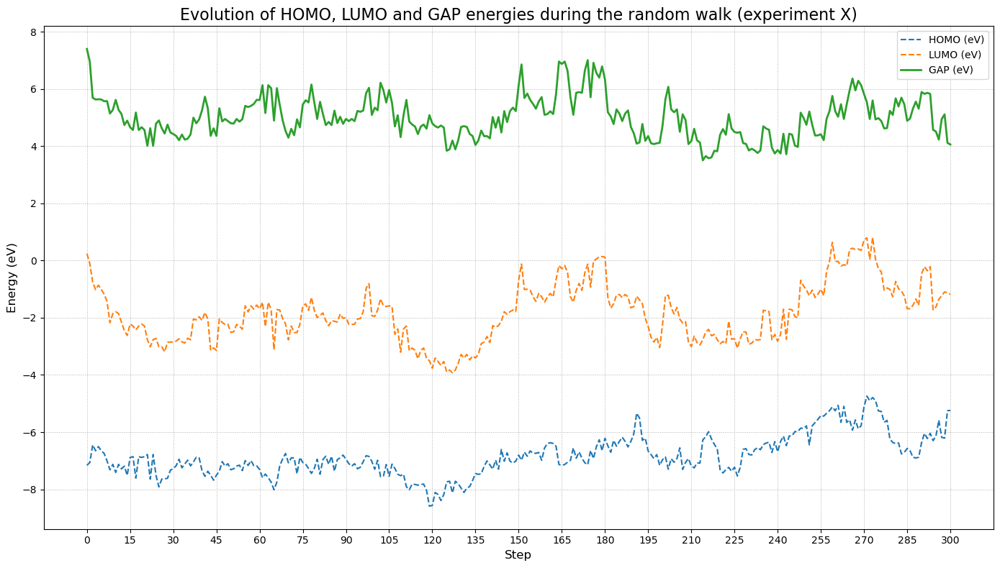

In [12]:
import matplotlib.pyplot as plt
import re
import os

# --- Configuration ---

# Nom du fichier d'entrée
NOM_FICHIER_INPUT = 'marche_aleatoire.txt'

# Nom du fichier image de sortie
NOM_FICHIER_OUTPUT = 'evolution_energies.png'

# Constante de conversion Hartree vers eV
HARTREE_TO_EV = 27.211386

# --- Initialisation des listes pour stocker les données ---
etapes = []
homo_energies_ev = []
lumo_energies_ev = []
gap_energies_ev = []

# --- Compilation des expressions régulières pour l'efficacité ---
# Regex pour trouver le numéro de l'étape
re_etape = re.compile(r"^\s*ÉTAPE (\d+)")

# Regex pour trouver l'énergie HOMO (en Ha)
re_homo = re.compile(r"^\s*HOMO:\s+(-?\d+\.\d+)\s+Ha")

# Regex pour trouver l'énergie LUMO (en Ha)
re_lumo = re.compile(r"^\s*LUMO:\s+(-?\d+\.\d+)\s+Ha")

# Regex pour trouver le GAP (déjà en eV)
re_gap = re.compile(r"^\s*GAP:\s+(-?\d+\.\d+)\s+eV")

# --- Traitement du fichier ---

# Vérifier si le fichier existe
if not os.path.exists(NOM_FICHIER_INPUT):
    print(f"Erreur : Le fichier '{NOM_FICHIER_INPUT}' n'a pas été trouvé.")
    print("Veuillez placer ce script dans le même dossier que votre fichier de données.")
else:
    print(f"Lecture du fichier '{NOM_FICHIER_INPUT}'...")
    
    # Ouvrir et lire le fichier ligne par ligne
    with open(NOM_FICHIER_INPUT, 'r', encoding='utf-8') as f:
        for line in f:
            
            # Chercher le numéro de l'étape
            match_etape = re_etape.search(line)
            if match_etape:
                etapes.append(int(match_etape.group(1)))
                continue # Passer à la ligne suivante

            # Chercher l'énergie HOMO
            match_homo = re_homo.search(line)
            if match_homo:
                homo_ha = float(match_homo.group(1))
                # Convertir en eV et stocker
                homo_energies_ev.append(homo_ha * HARTREE_TO_EV)
                continue

            # Chercher l'énergie LUMO
            match_lumo = re_lumo.search(line)
            if match_lumo:
                lumo_ha = float(match_lumo.group(1))
                # Convertir en eV et stocker
                lumo_energies_ev.append(lumo_ha * HARTREE_TO_EV)
                continue

            # Chercher le GAP
            match_gap = re_gap.search(line)
            if match_gap:
                # Le GAP est déjà en eV
                gap_energies_ev.append(float(match_gap.group(1)))
                continue

    print(f"Données extraites pour {len(etapes)} étapes.")

    # --- Génération du graphique ---
    if etapes and homo_energies_ev and lumo_energies_ev and gap_energies_ev:
        
        # S'assurer qu'on a le même nombre de points pour chaque série
        min_len = min(len(etapes), len(homo_energies_ev), len(lumo_energies_ev), len(gap_energies_ev))
        
        etapes = etapes[:min_len]
        homo_energies_ev = homo_energies_ev[:min_len]
        lumo_energies_ev = lumo_energies_ev[:min_len]
        gap_energies_ev = gap_energies_ev[:min_len]

        
        plt.figure(figsize=(14, 8)) # Définir la taille du graphique

        # Tracer chaque série de données
        plt.plot(etapes, homo_energies_ev,  linestyle='--', label='HOMO (eV)')
        plt.plot(etapes, lumo_energies_ev,  linestyle='--', label='LUMO (eV)')
        plt.plot(etapes, gap_energies_ev,  linestyle='-', label='GAP (eV)', linewidth=2)

        # Ajouter les titres et étiquettes
        plt.title("Evolution of HOMO, LUMO and GAP energies during the random walk (experiment X)", fontsize=16)
        plt.xlabel("Step", fontsize=12)
        plt.ylabel("Energy (eV)", fontsize=12)

        # Ajouter une légende
        plt.legend()

        # Ajouter une grille pour une meilleure lisibilité
        plt.grid(True, which='both', linestyle=':', linewidth=0.7)

        # Gérer l'affichage des ticks sur l'axe X (surtout s'il y a 200 étapes)
        if len(etapes) > 50:
            # Afficher un tick toutes les N étapes pour éviter la surcharge
            tick_spacing = max(1, len(etapes) // 20) # Viser ~20 ticks
            plt.xticks(etapes[::tick_spacing])
        else:
            plt.xticks(etapes) # Afficher toutes les étapes si elles sont peu nombreuses

        plt.tight_layout() # Ajuster le graphique pour éviter les superpositions

        # Sauvegarder le graphique dans un fichier
        plt.savefig(NOM_FICHIER_OUTPUT)
        print(f"Graphique sauvegardé sous : '{NOM_FICHIER_OUTPUT}'")

        # Afficher le graphique
        plt.show()

    else:
        print("Erreur : Aucune donnée complète n'a été trouvée. Vérifiez le format du fichier.")

### Le code en desous sert a observer une partie de la marche aleatoire

VISUALISATION DES MOLÉCULES - MARCHE ALÉATOIRE

Lecture du fichier 'marche_aleatoire.txt'...
✓ 301 étapes trouvées

Étapes disponibles: 0 à 300

------------------------------------------------------------



------------------------------------------------------------
Génération des visualisations pour les étapes 1 à 100...
------------------------------------------------------------

Création du graphique des énergies avec molécules:

✓ Graphique sauvegardé: energies_molecules_etapes_1_100.png


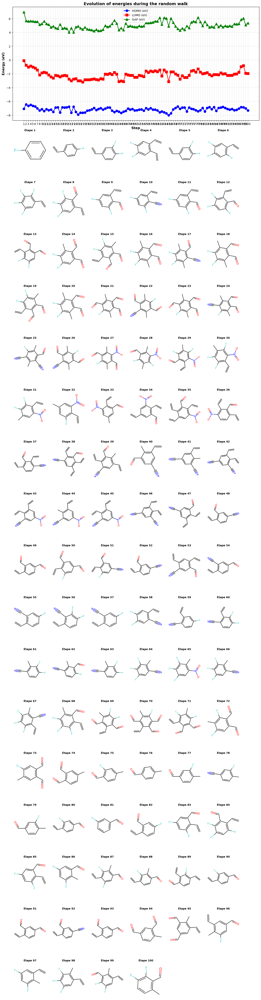


TERMINÉ!


In [11]:
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from rdkit import Chem
from rdkit.Chem import Draw
from io import BytesIO
from PIL import Image
import numpy as np

def parser_fichier_marche(fichier='marche_aleatoire.txt'):
    """Parse le fichier de marche aléatoire et extrait les données"""
    with open(fichier, 'r', encoding='utf-8') as f:
        contenu = f.read()
    
    # Trouver toutes les étapes
    etapes = []
    pattern_etape = r'ÉTAPE (\d+)(?:\s*-\s*COMPOSÉ DE DÉPART)?\n-+\n(.*?)(?=ÉTAPE \d+|FIN DE LA MARCHE|$)'
    
    # Ajouter l'étape 0 séparément
    match_etape0 = re.search(r'ÉTAPE 0 - COMPOSÉ DE DÉPART\n-+\n(.*?)(?=ÉTAPE 1|$)', contenu, re.DOTALL)
    if match_etape0:
        etapes.append((0, match_etape0.group(1)))
    
    # Trouver les autres étapes
    for match in re.finditer(r'ÉTAPE (\d+)\n-+\n(.*?)(?=ÉTAPE \d+|FIN DE LA MARCHE|$)', contenu, re.DOTALL):
        num_etape = int(match.group(1))
        if num_etape > 0:
            etapes.append((num_etape, match.group(2)))
    
    # Parser chaque étape
    donnees_etapes = []
    for num_etape, texte_etape in etapes:
        donnee = {'etape': num_etape}
        
        # Extraire SMILES
        match_smiles = re.search(r'SMILES:\s*(.+)', texte_etape)
        if match_smiles:
            donnee['smiles'] = match_smiles.group(1).strip()
        
        # Extraire substituants
        match_sub = re.search(r'Positions:\s*(.+)', texte_etape)
        if match_sub:
            donnee['positions'] = match_sub.group(1).strip()
        
        # Extraire énergies
        match_homo = re.search(r'HOMO:\s*([-\d.]+)', texte_etape)
        match_lumo = re.search(r'LUMO:\s*([-\d.]+)', texte_etape)
        match_gap = re.search(r'GAP:\s*([-\d.]+)', texte_etape)
        
        if match_homo:
            donnee['HOMO'] = float(match_homo.group(1))
        if match_lumo:
            donnee['LUMO'] = float(match_lumo.group(1))
        if match_gap:
            donnee['GAP'] = float(match_gap.group(1))
        
        donnees_etapes.append(donnee)
    
    return donnees_etapes

def creer_image_molecule(smiles, taille=(300, 300)):
    """Crée une image de la molécule à partir du SMILES"""
    try:
        mol = Chem.MolFromSmiles(smiles)
        if mol is None:
            print(f"Erreur: SMILES invalide '{smiles}'")
            return None
        
        # Générer l'image
        img = Draw.MolToImage(mol, size=taille)
        return img
    except Exception as e:
        print(f"Erreur lors de la création de l'image: {e}")
        return None

def sauvegarder_molecules_individuelles(donnees, intervalle):
    """Sauvegarde les images individuelles des molécules (DÉSACTIVÉ)"""
    # Fonction désactivée - ne sauvegarde plus les images individuelles
    print("Images individuelles: Sauvegarde désactivée")
    return []

def creer_graphique_energies(donnees, intervalle):
    """Crée un graphique des énergies avec les molécules en dessous"""
    debut, fin = intervalle
    
    # Constante de conversion Ha -> eV
    HA_TO_EV = 27.211386245988
    
    # Filtrer les données selon l'intervalle
    donnees_filtrees = [d for d in donnees if debut <= d['etape'] <= fin and 'GAP' in d]
    
    if not donnees_filtrees:
        print("Aucune donnée d'énergie trouvée dans cet intervalle!")
        return
    
    # Préparer les données et convertir Ha en eV
    etapes = [d['etape'] for d in donnees_filtrees]
    homos = [d['HOMO'] * HA_TO_EV for d in donnees_filtrees]
    lumos = [d['LUMO'] * HA_TO_EV for d in donnees_filtrees]
    gaps = [d['GAP'] for d in donnees_filtrees]
    
    # Créer les images des molécules
    images_molecules = []
    for d in donnees_filtrees:
        if 'smiles' in d:
            img = creer_image_molecule(d['smiles'], taille=(200, 200))
            images_molecules.append(img)
        else:
            images_molecules.append(None)
    
    # Créer la figure avec deux subplots
    fig = plt.figure(figsize=(14, 10))
    
    # Subplot du haut: graphique des énergies
    ax1 = plt.subplot(2, 1, 1)
    
    # Tracer les courbes
    ax1.plot(etapes, homos, 'o-', label='HOMO (eV)', linewidth=2, markersize=8, color='blue')
    ax1.plot(etapes, lumos, 's-', label='LUMO (eV)', linewidth=2, markersize=8, color='red')
    ax1.plot(etapes, gaps, '^-', label='GAP (eV)', linewidth=2, markersize=8, color='green')

    ax1.set_xlabel('Step', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Energy (eV)', fontsize=12, fontweight='bold')
    ax1.set_title('Evolution of energies during the random walk', fontsize=14, fontweight='bold')
    ax1.legend(loc='best', fontsize=10)
    ax1.grid(True, alpha=0.3)
    ax1.set_xticks(etapes)
    
    # Calculer le nombre de lignes nécessaires (6 molécules par ligne)
    n_molecules = len(images_molecules)
    molecules_par_ligne = 6
    n_lignes = (n_molecules + molecules_par_ligne - 1) // molecules_par_ligne  # Arrondi supérieur
    
    # Ajuster la taille de la figure en fonction du nombre de lignes
    hauteur_par_ligne = 2.5
    hauteur_graphique = 8  # Graphique 2x plus haut
    espacement = 0.0  # Pas d'espace entre graphique et molécules
    hauteur_totale = hauteur_graphique + espacement + (n_lignes * hauteur_par_ligne)
    fig.set_size_inches(14, hauteur_totale)
    
    # Calculer les positions sans espace
    hauteur_molecules = n_lignes * hauteur_par_ligne
    y_start_molecules = 0.05
    y_end_molecules = y_start_molecules + (hauteur_molecules / hauteur_totale)
    y_start_graphique = y_end_molecules  # Directement collé
    y_end_graphique = y_start_graphique + (hauteur_graphique / hauteur_totale) - 0.05
    
    # Positionner le graphique
    ax1.set_position([0.1, y_start_graphique, 0.85, y_end_graphique - y_start_graphique])
    
    # Afficher les molécules en grille (6 par ligne)
    if n_molecules > 0:
        for i, (img, etape) in enumerate(zip(images_molecules, etapes)):
            if img:
                # Calculer la position en grille
                ligne = i // molecules_par_ligne
                colonne = i % molecules_par_ligne
                
                # Calculer les positions avec espacement fixe
                largeur_case = 0.8 / molecules_par_ligne
                hauteur_case_ratio = (hauteur_molecules / hauteur_totale) / n_lignes
                
                x_pos = 0.1 + colonne * largeur_case
                y_pos = y_start_molecules + (n_lignes - ligne - 1) * hauteur_case_ratio
                
                # Créer un sous-axe pour chaque molécule
                ax_img = fig.add_axes([x_pos, y_pos, largeur_case * 0.9, hauteur_case_ratio * 0.85])
                ax_img.imshow(img)
                ax_img.axis('off')
                ax_img.set_title(f'Étape {etape}', fontsize=9, fontweight='bold')
    
    # Sauvegarder
    nom_fichier = f"energies_molecules_etapes_{debut}_{fin}.png"
    plt.savefig(nom_fichier, dpi=300, bbox_inches='tight')
    print(f"\n✓ Graphique sauvegardé: {nom_fichier}")
    
    plt.show()

def main():
    """Fonction principale"""
    print("=" * 60)
    print("VISUALISATION DES MOLÉCULES - MARCHE ALÉATOIRE")
    print("=" * 60)
    
    # Parser le fichier
    print("\nLecture du fichier 'marche_aleatoire.txt'...")
    try:
        donnees = parser_fichier_marche('marche_aleatoire.txt')
        print(f"✓ {len(donnees)} étapes trouvées")
        
        # Afficher les étapes disponibles
        print(f"\nÉtapes disponibles: 0 à {max(d['etape'] for d in donnees)}")
        
    except FileNotFoundError:
        print("❌ Erreur: Fichier 'marche_aleatoire.txt' non trouvé!")
        return
    except Exception as e:
        print(f"❌ Erreur lors de la lecture: {e}")
        return
    
    # Demander l'intervalle
    print("\n" + "-" * 60)
    try:
        debut = int(input("Étape de début: "))
        fin = int(input("Étape de fin: "))
        
        if debut > fin:
            print("❌ L'étape de début doit être <= à l'étape de fin!")
            return
        
        if debut < 0 or fin > max(d['etape'] for d in donnees):
            print(f"❌ Les étapes doivent être entre 0 et {max(d['etape'] for d in donnees)}!")
            return
        
        intervalle = (debut, fin)
        
    except ValueError:
        print("❌ Veuillez entrer des nombres entiers!")
        return
    
    print("\n" + "-" * 60)
    print(f"Génération des visualisations pour les étapes {debut} à {fin}...")
    print("-" * 60)
    
    # Créer le graphique avec énergies
    print("\nCréation du graphique des énergies avec molécules:")
    creer_graphique_energies(donnees, intervalle)
    
    print("\n" + "=" * 60)
    print("TERMINÉ!")
    print("=" * 60)

if __name__ == "__main__":
    main()